In [1]:
import numpy as np
from sklearn.neighbors import KernelDensity
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import MinMaxScaler

from _plotly_future_ import v4_subplots
import plotly as py
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly.offline import iplot
from plotly.offline import plot
import ipywidgets as widgets

# %matplotlib widget
py.offline.init_notebook_mode(connected=True)

In [38]:
n_samples = 500

# generate random sample, two components
np.random.seed(0)

# # generate spherical data centered on (20, 20)
shifted_gaussian = np.random.randn(n_samples, 2) + np.array([20, 20])

# # generate zero centered stretched Gaussian data
C = np.array([[0., -0.7], [3.5, .7]])
stretched_gaussian = np.dot(np.random.randn(n_samples, 2), C)

# # concatenate the two datasets into the final training set
# X_train = np.vstack([shifted_gaussian, stretched_gaussian])

X_train = stretched_gaussian

thin_gauss = np.random.pareto(a=5, size=(n_samples,2))
fat_gauss = np.random.normal(scale=3, size=(n_samples,2))

In [39]:
# a, m = 3., 2.  # shape and mode
# (np.random.pareto(a, (10,2)) + 1) * m

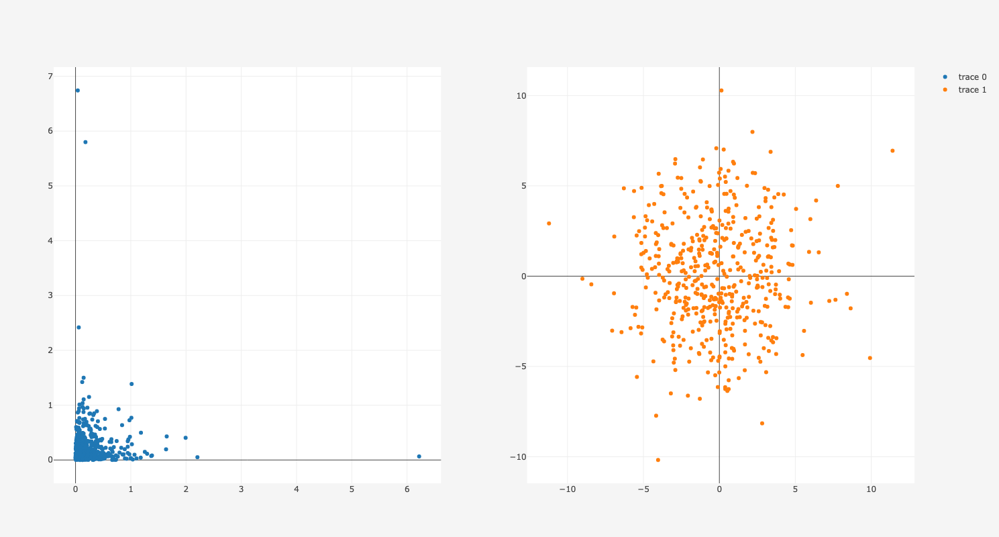

In [40]:
shifted_pts = go.Scatter(
    x=shifted_gaussian[:,0],
    y=shifted_gaussian[:,1],
    mode="markers"
)

stretched_pts = go.Scatter(
    x=stretched_gaussian[:,0],
    y=stretched_gaussian[:,1],
    mode="markers"
)

thin_pts = go.Scatter(
    x=thin_gauss[:,0],
    y=thin_gauss[:,1],
    mode="markers"
)

fat_pts = go.Scatter(
    x=fat_gauss[:,0],
    y=fat_gauss[:,1],
    mode="markers"
)

layout = go.Layout(
    autosize=False,
    width=1600,
    height=800,
    paper_bgcolor='#F5F5F5'
)

fig = make_subplots(rows=1, cols=2)

fig.add_trace(thin_pts, row=1,col=1)
fig.add_trace(fat_pts, row=1,col=2)
fig.layout.update(layout)

iplot(fig)

In [6]:
'''
Non-parametric computation of entropy and mutual-information

Adapted by G Varoquaux for code created by R Brette, itself
from several papers (see in the code).

These computations rely on nearest-neighbor statistics
'''
import numpy as np

from scipy.special import gamma,psi
from scipy import ndimage
from scipy.linalg import det
from numpy import pi

from sklearn.neighbors import NearestNeighbors

__all__=['entropy', 'mutual_information', 'entropy_gaussian']

EPS = np.finfo(float).eps


def nearest_distances(X, k=1):
    '''
    X = array(N,M)
    N = number of points
    M = number of dimensions

    returns the distance to the kth nearest neighbor for every point in X
    '''
    knn = NearestNeighbors(n_neighbors=k)
    knn.fit(X)
    d, _ = knn.kneighbors(X) # the first nearest neighbor is itself
    return d[:, -1] # returns the distance to the kth nearest neighbor

def entropy(X, k=1):
    ''' Returns the entropy of the X.

    Parameters
    ===========

    X : array-like, shape (n_samples, n_features)
        The data the entropy of which is computed

    k : int, optional
        number of nearest neighbors for density estimation

    Notes
    ======

    Kozachenko, L. F. & Leonenko, N. N. 1987 Sample estimate of entropy
    of a random vector. Probl. Inf. Transm. 23, 95-101.
    See also: Evans, D. 2008 A computationally efficient estimator for
    mutual information, Proc. R. Soc. A 464 (2093), 1203-1215.
    and:
    Kraskov A, Stogbauer H, Grassberger P. (2004). Estimating mutual
    information. Phys Rev E 69(6 Pt 2):066138.
    '''

    # Distance to kth nearest neighbor
    r = nearest_distances(X, k) # squared distances
    n, d = X.shape
    volume_unit_ball = (pi**(.5*d)) / gamma(.5*d + 1)
    '''
    F. Perez-Cruz, (2008). Estimation of Information Theoretic Measures
    for Continuous Random Variables. Advances in Neural Information
    Processing Systems 21 (NIPS). Vancouver (Canada), December.

    return d*mean(log(r))+log(volume_unit_ball)+log(n-1)-log(k)
    '''
    return (d*np.mean(np.log(r + np.finfo(X.dtype).eps))
            + np.log(volume_unit_ball) + psi(n) - psi(k))

print("Shifted:", entropy(shifted_gaussian, k=100))
print("Stretched:", entropy(stretched_gaussian, k=100))

Shifted: 2.715952729916701
Stretched: 3.8289323639590673


In [65]:
nbins  = 10
xedges = np.linspace(-8,8,nbins+1)
yedges = np.linspace(-3,3,nbins+1)

xx, yy = np.meshgrid(xedges,yedges)
grid = np.array([x for x in zip(xx.ravel(), yy.ravel())])

In [124]:
%%time
## Generating Multidimensional grid with equal ranges (hypercube)
dims = 3
nbins = 50
dimedges = [np.linspace(0,3, nbins+1)] * dims
mesh = np.meshgrid(*dimedges)
grid = np.array([x for x in zip(*[xx.ravel() for xx in mesh])])

CPU times: user 104 ms, sys: 4.8 ms, total: 109 ms
Wall time: 107 ms


In [125]:
grid.shape
(nbins+1)**2

2601

In [126]:
# %%timeit
# grid = np.array([x for x in zip(xx.ravel(), yy.ravel())])
# grid[:5]

In [127]:
%%time
_X_train = np.random.pareto(a=5, size=(n_samples, dims))
kde = KernelDensity(kernel='gaussian', bandwidth=0.2).fit(_X_train)

CPU times: user 718 µs, sys: 491 µs, total: 1.21 ms
Wall time: 727 µs


In [128]:
# _samples = kde.samples(1000)
log_dens_kde=kde.score_samples(grid)
np.exp(log_dens_kde).max()

3.1455832994671926

In [129]:
kde_hmap = np.exp(log_dens_kde.reshape([nbins+1]*dims))

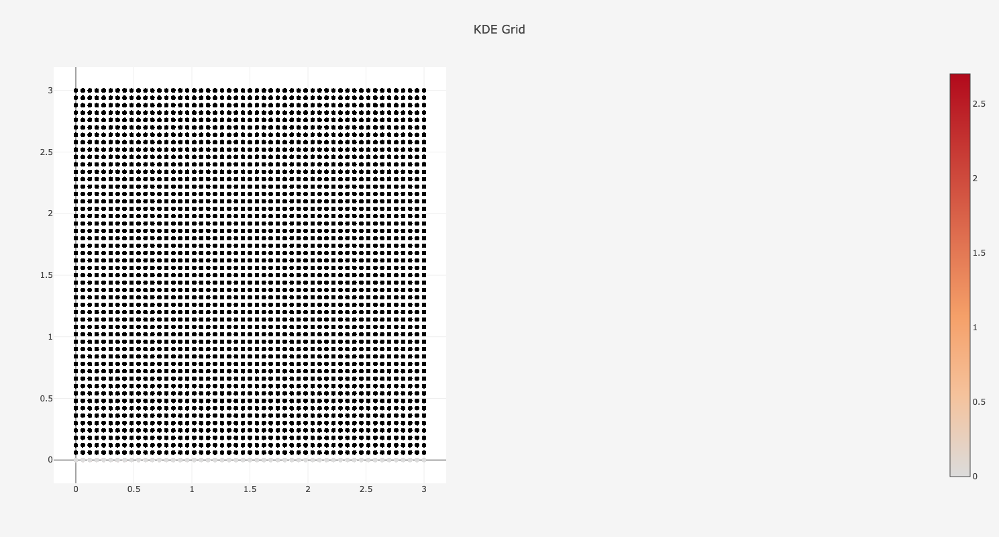

In [130]:
grid_pts = go.Scatter(
                x=grid[:,0],
                y=grid[:,1],
                mode="markers",
                marker=dict(
                    color=np.exp(log_dens_kde),
                    showscale=True
                ),
                text=np.exp(log_dens_kde)
            )

# grid_hm = go.Heatmap(
#     z=kde_hmap,
#     colorscale = 'Reds'
# )

layout = go.Layout(
    title="KDE Grid",
    autosize=False,
    width=1600,
    height=800,
    paper_bgcolor='#F5F5F5'
)

fig = make_subplots(rows=1, cols=2)

fig.add_trace(grid_pts, row=1,col=1)
# fig.add_trace(grid_hm, row=1,col=1)
fig.layout.update(layout)

# go.Figure(data=[grid_hm], layout=layout)
iplot(fig)

In [106]:
np.array([row[:2] for row in kde_hmap])

array([[[1.93328228e+00, 2.24000044e+00, 1.77983453e+00, 1.12969528e+00,
         6.87090693e-01, 4.16777638e-01, 2.33268415e-01, 1.20820898e-01,
         6.39634946e-02, 3.91174129e-02, 3.02179275e-02, 2.35741438e-02,
         1.39142462e-02, 6.10251046e-03, 2.39923492e-03, 8.65600601e-04,
         2.26202031e-04, 3.62755153e-05, 3.37840349e-06, 1.80113848e-07,
         5.47755569e-09],
        [2.34195183e+00, 2.73249710e+00, 2.19528917e+00, 1.41094482e+00,
         8.59804741e-01, 5.12129017e-01, 2.78796622e-01, 1.43157647e-01,
         7.78212218e-02, 4.69929424e-02, 3.29614713e-02, 2.46441103e-02,
         1.61139614e-02, 9.55689970e-03, 5.43681751e-03, 2.39387928e-03,
         6.66178424e-04, 1.08575192e-04, 1.01518446e-05, 5.41747928e-07,
         1.64792887e-08]],

       [[2.24179242e+00, 2.60152439e+00, 2.06350464e+00, 1.30158358e+00,
         7.88651262e-01, 4.80166228e-01, 2.72551925e-01, 1.48495020e-01,
         8.78600561e-02, 6.14567248e-02, 4.99366422e-02, 3.71280705e-0

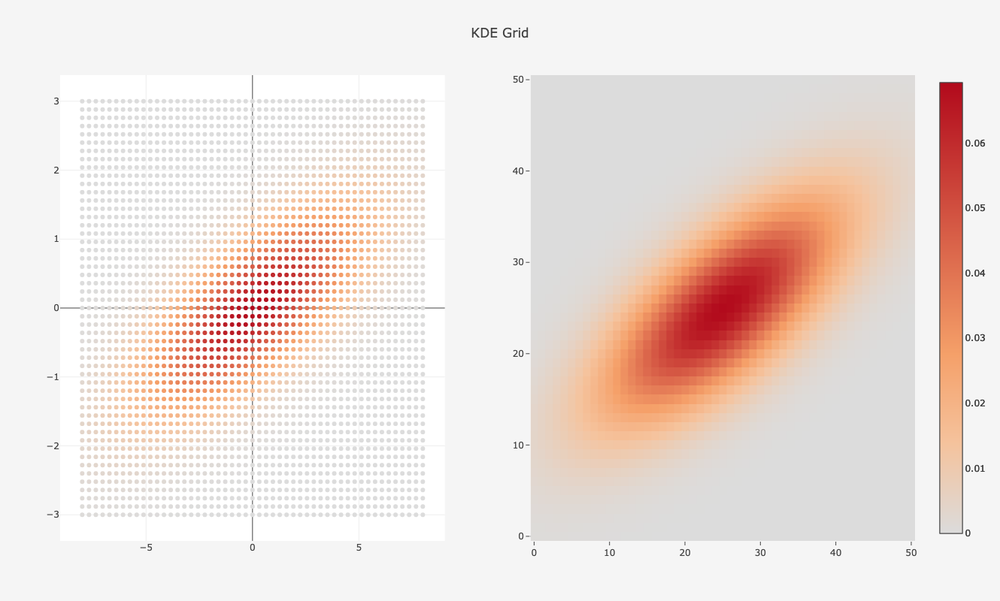

3700.0127949977045

In [97]:
gmm = GaussianMixture(n_components=1).fit(X_train)

log_dens_gmm=gmm.score_samples(grid)
grid_pts["marker"]["color"] = np.exp(log_dens_gmm)
grid_hm["z"] = np.exp(log_dens_gmm).reshape(nbins+1,nbins+1)


fig = make_subplots(rows=1, cols=2)

fig.add_trace(grid_pts, row=1,col=1)
fig.add_trace(grid_hm, row=1,col=2)

fig.layout.update(layout)

iplot(fig)
gmm.bic(X_train)

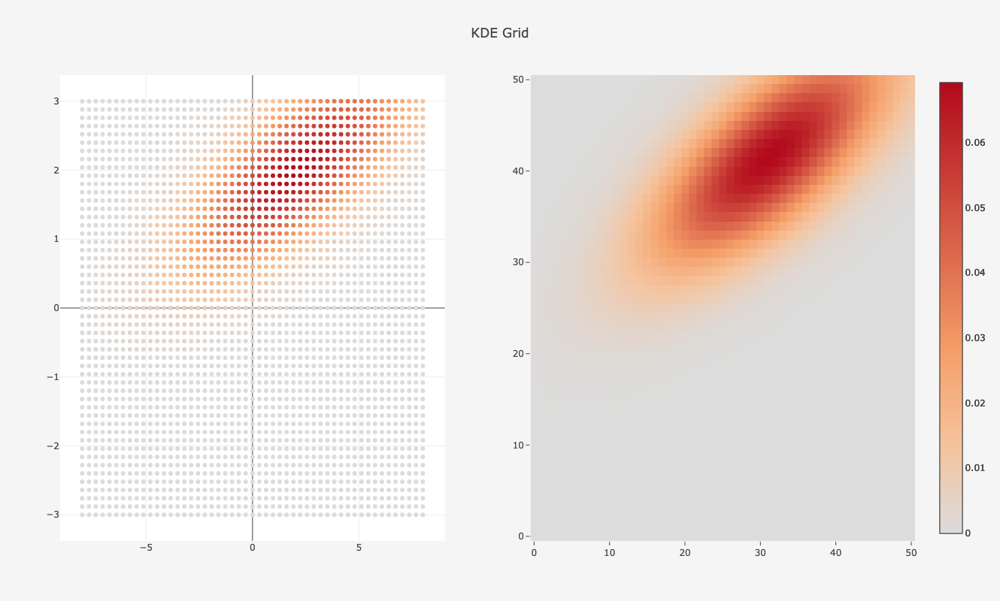

In [98]:
gmm = GaussianMixture(n_components=1).fit(X_train+2)

log_dens_gmm=gmm.score_samples(grid)
grid_pts["marker"]["color"] = np.exp(log_dens_gmm)
grid_hm["z"] = np.exp(log_dens_gmm).reshape(nbins+1,nbins+1)


fig = make_subplots(rows=1, cols=2)

fig.add_trace(grid_pts, row=1,col=1)
fig.add_trace(grid_hm, row=1,col=2)
fig.layout.update(layout)

iplot(fig)


In [51]:
gmm.bic(X_train+2)

1668.7851376401243

In [99]:
%%time

lowest_bic = np.infty
bic = []
n_components_range = range(1, 7)
cv_types = ['spherical', 'tied', 'diag', 'full']
for cv_type in cv_types:
    for n_components in n_components_range:
        # Fit a Gaussian mixture with EM
        gmm = GaussianMixture(n_components=n_components,
                              covariance_type=cv_type)
        gmm.fit(X_train)
        bic.append(gmm.bic(X_train))
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm
best_gmm

CPU times: user 151 ms, sys: 2.62 ms, total: 153 ms
Wall time: 152 ms


GaussianMixture(covariance_type='tied', init_params='kmeans', max_iter=100,
                means_init=None, n_components=1, n_init=1, precisions_init=None,
                random_state=None, reg_covar=1e-06, tol=0.001, verbose=0,
                verbose_interval=10, warm_start=False, weights_init=None)

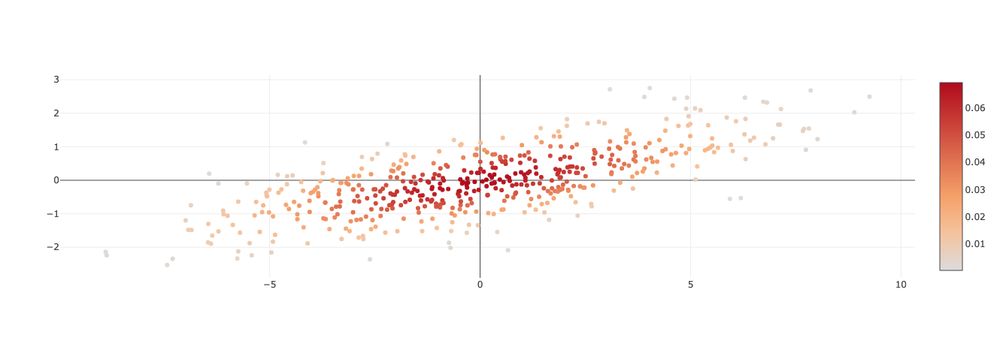

3700.0127949977045

In [100]:
log_dens_gmm=best_gmm.score_samples(X_train)

pts["marker"]["color"] = np.exp(log_dens_gmm)
pts["marker"]["showscale"]=True
iplot([pts])
best_gmm.bic(X_train)

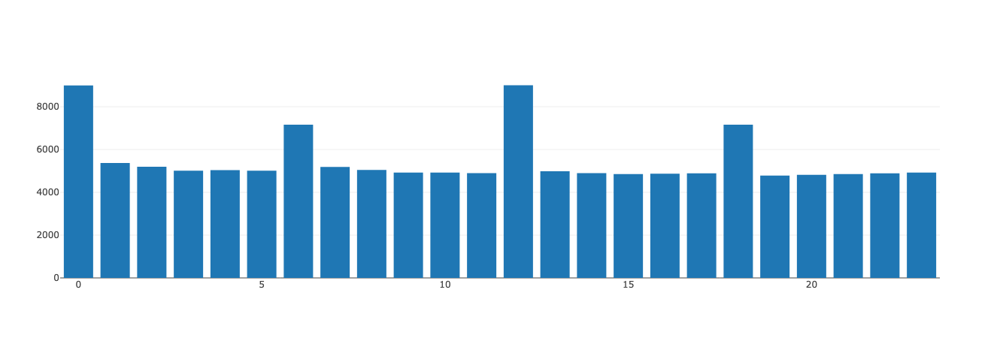

In [44]:
# bic_bar = go.Bar(
#     x=[x for x in range(0,len(bic))],
#     y=bic
# )
# iplot([bic_bar])

## Histogramming Data as Density Estimate

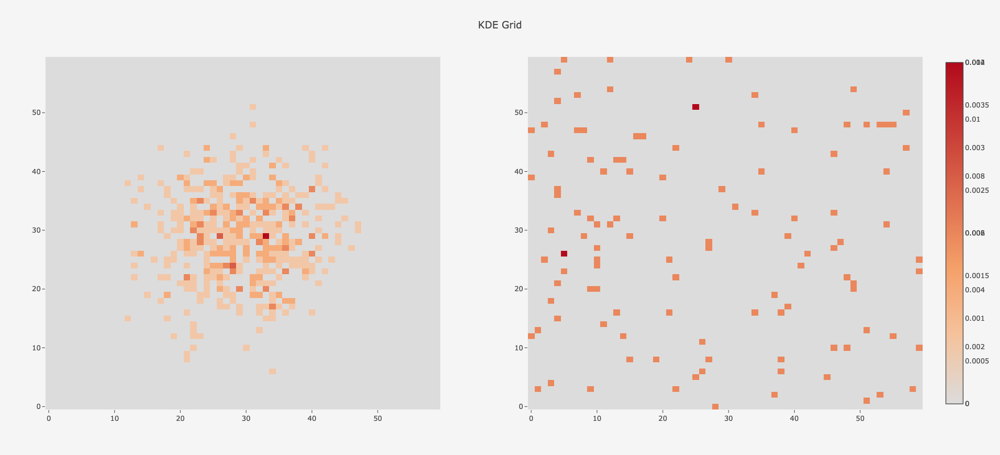

In [44]:
nbins=60
ranges = [(-2,2),(-2,2)]

hist, edges = np.histogramdd(thin_gauss, bins=nbins, range=ranges)
hist_densities_thin = (hist/n_samples)

hist, edges = np.histogramdd(fat_gauss, bins=nbins, range=ranges)
hist_densities_fat = (hist/n_samples)

hist_hm_thin = go.Heatmap(
    z=hist_densities_thin,
    colorscale = 'Reds'
)

hist_hm_fat = go.Heatmap(
    z=hist_densities_fat,
    colorscale = 'Reds'
)

layout = go.Layout(
    title="KDE Grid",
    autosize=False,
    width=1600,
    height=800,
    paper_bgcolor='#F5F5F5'
)

fig = make_subplots(rows=1, cols=2)

fig.add_trace(hist_hm_thin, row=1,col=1)
fig.add_trace(hist_hm_fat, row=1,col=2)
fig.layout.update(layout)

# go.Figure(data=[grid_hm], layout=layout)
iplot(fig)

In [45]:
import scipy.stats as scp

print("Low Variance Gauss:", scp.entropy(hist_densities_thin.flatten()))
print("High Variance Gauss:", scp.entropy(hist_densities_fat.flatten()))

Low Variance Gauss: 5.785373830221666
High Variance Gauss: 4.720822661213338
